# <center> Adult Dataset - EDA Part</center>

### INDEX
<ul>
<li><a href="#EDA">EDA</a></li>
</ul>

In [47]:
# importing needed libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

<a id="Cleaning"> </a>
## EDA
in this step we clean the dataset from nulls,duplicates , outliers and make the dataset ready for the visulaization

In [48]:
df=pd.read_csv('../data/processed/Adults_salaries_cleaned.csv')
df

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45170,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
45171,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
45172,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
45173,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45175 entries, 0 to 45174
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              45175 non-null  int64 
 1   workclass        45175 non-null  object
 2   fnlwgt           45175 non-null  int64 
 3   education        45175 non-null  object
 4   educational-num  45175 non-null  int64 
 5   marital-status   45175 non-null  object
 6   occupation       45175 non-null  object
 7   relationship     45175 non-null  object
 8   race             45175 non-null  object
 9   gender           45175 non-null  object
 10  capital-gain     45175 non-null  int64 
 11  capital-loss     45175 non-null  int64 
 12  hours-per-week   45175 non-null  int64 
 13  native-country   45175 non-null  object
 14  income           45175 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.2+ MB


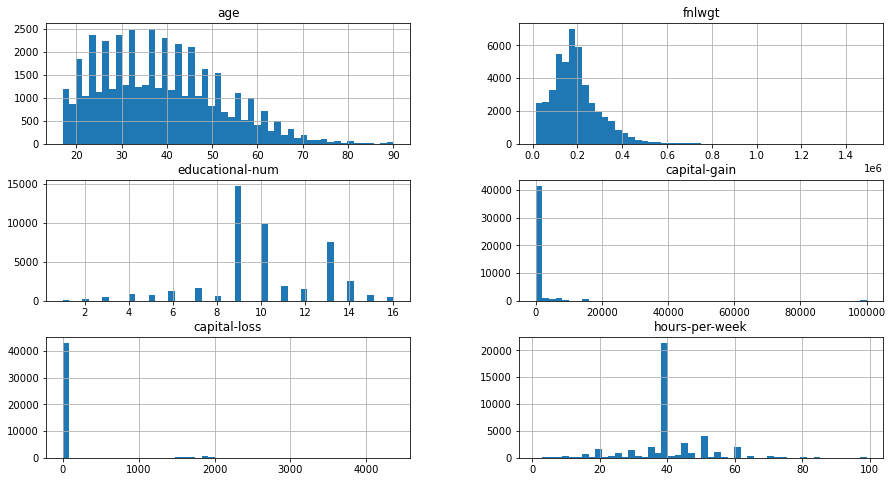

In [50]:
df.hist(figsize=(15, 8),bins = 50)
plt.show()

In [51]:
df['marital-status'].unique()

array(['Never-married', 'Married-civ-spouse', 'Widowed', 'Separated',
       'Divorced', 'Married-spouse-absent', 'Married-AF-spouse'],
      dtype=object)

In [52]:
def convert_marital_status(status):
    if status in ['Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse']:
        return 'married'
    elif status in ['Never-married', 'Separated', 'Widowed']:
        return 'single'
    else:
        return 'divorced'
df['marital-status'] = df['marital-status'].apply(convert_marital_status)


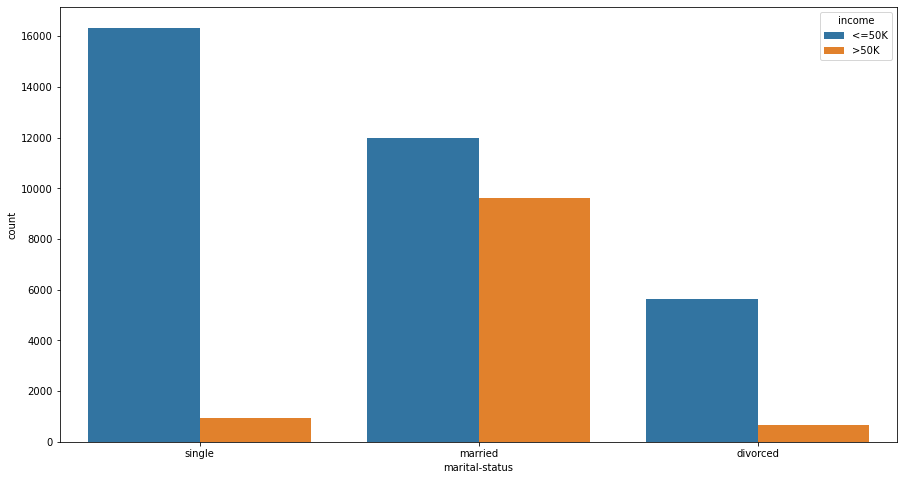

In [53]:
plt.figure(figsize=(15, 8))
sns.countplot(data=df, x='marital-status', hue='income')
plt.show()

In [54]:
fig = px.histogram(df, x='marital-status', color='income',title='how marital status influence income')
fig.show()

In [55]:
gender_counts=df.gender.value_counts()
gender_counts=gender_counts.reset_index().rename(columns={'index': 'gender', 'gender': 'counts'})
gender_counts

,gender,counts
0,Male,30495
1,Female,14680


In [56]:
fig2 = px.pie(gender_counts, values='counts', names='gender', title='gender')
fig2.show()

In [57]:
df['education'].unique()

array(['11th', 'HS-grad', 'Assoc-acdm', 'Some-college', '10th',
       'Prof-school', '7th-8th', 'Bachelors', 'Masters', '5th-6th',
       'Assoc-voc', '9th', 'Doctorate', '12th', '1st-4th', 'Preschool'],
      dtype=object)

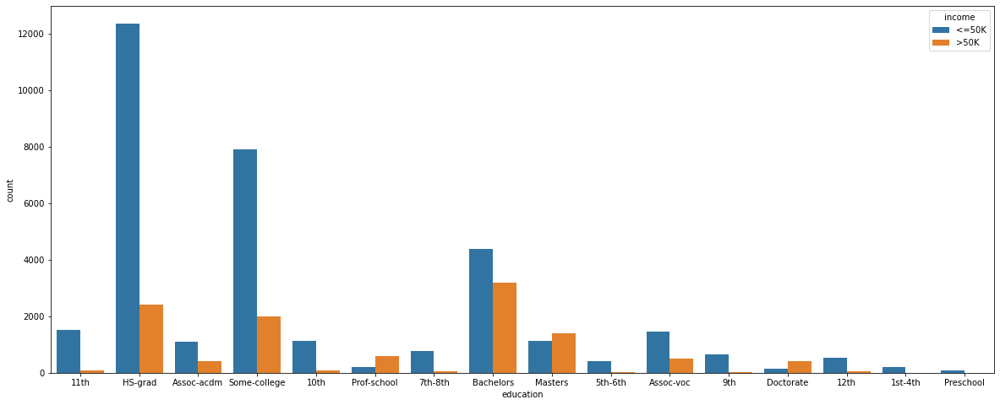

In [58]:
plt.figure(figsize=(20, 8))
sns.countplot(data=df, x='education', hue='income')
plt.show()

In [59]:
race_counts=df.race.value_counts()
race_counts

White                 38859
Black                  4227
Asian-Pac-Islander     1301
Amer-Indian-Eskimo      435
Other                   353
Name: race, dtype: int64

In [60]:
race_counts=race_counts.reset_index().rename(columns={'index': 'race', 'race': 'counts'})
race_counts

,race,counts
0,White,38859
1,Black,4227
2,Asian-Pac-Islander,1301
3,Amer-Indian-Eskimo,435
4,Other,353


In [61]:
fig1 = px.pie(race_counts, values='counts', names='race', title='race')
fig1.show()

In [62]:
fig = px.histogram(df, x='native-country', color='income',title='income through countries')
fig.show()

In [63]:
def convert_native_country(status):
    if status == "United-States":
        return 'United-States'
    else:
        return 'Other'
df['native-country'] = df['native-country'].apply(convert_native_country)

In [64]:
fig = px.histogram(df, x='native-country', color='income',title='income through countries')
fig.show()

### LET SEE AVERAGE HOURS PER WEEK FOR EACH GENDER 

In [65]:
df.groupby('gender')['hours-per-week'].mean()

gender
Female    36.937943
Male      42.870274
Name: hours-per-week, dtype: float64

In [66]:
gender_hours_counts=df.groupby('gender')['hours-per-week'].mean().reset_index()
gender_hours_counts

,gender,hours-per-week
0,Female,36.937943
1,Male,42.870274


### BUT IF WE WANNA EXPRESS ABOUT THE COUNT OF PEOPLE SPENT HOURS IN WEEK  , WE REPRENT IT LIKE THIS

In [67]:
fig=px.histogram(df,x='hours-per-week',color='income',title='how hours of week influences income')
fig.show()

In [68]:
fig=px.box(df,x='age',title=' Age')
fig.show()

In [69]:
df[df['age']>75]

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
215,80,Self-emp-not-inc,201092,HS-grad,9,married,Other-service,Husband,White,Male,0,0,30,United-States,<=50K
831,90,Private,149069,Assoc-acdm,12,married,Sales,Husband,White,Male,0,1825,50,United-States,>50K
879,80,Private,138050,HS-grad,9,married,Machine-op-inspct,Not-in-family,White,Female,0,0,16,United-States,<=50K
953,77,Private,89655,HS-grad,9,single,Adm-clerical,Not-in-family,White,Female,0,0,40,United-States,<=50K
994,81,Private,184615,7th-8th,4,single,Machine-op-inspct,Unmarried,White,Female,1264,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44485,80,Self-emp-not-inc,26865,7th-8th,4,single,Farming-fishing,Unmarried,White,Male,0,0,20,United-States,<=50K
44524,82,Self-emp-not-inc,71438,HS-grad,9,married,Farming-fishing,Husband,White,Male,0,0,20,United-States,<=50K
44915,90,Private,313749,HS-grad,9,single,Adm-clerical,Unmarried,White,Female,0,0,25,United-States,<=50K
44997,90,Local-gov,214594,7th-8th,4,married,Protective-serv,Husband,White,Male,2653,0,40,United-States,<=50K


In [71]:
df = df.drop(df[df['age'] > 75].index)

In [72]:
fig=px.box(df,x='hours-per-week',title='Hours per week')
fig.show()

In [73]:
df[df['hours-per-week']<5] ### if the person spent 1 hr daily unlogic to spent less than that

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
778,23,Private,199011,11th,7,single,Craft-repair,Own-child,White,Male,0,0,3,United-States,<=50K
804,73,Self-emp-not-inc,252431,Some-college,10,married,Prof-specialty,Wife,White,Female,0,0,1,United-States,<=50K
1151,28,Private,106672,Bachelors,13,single,Sales,Own-child,White,Male,0,0,2,United-States,<=50K
1273,55,Private,266019,9th,5,married,Handlers-cleaners,Husband,Black,Male,0,0,4,United-States,<=50K
1662,49,Private,140782,Bachelors,13,married,Prof-specialty,Wife,White,Female,0,2415,3,United-States,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43193,56,Private,91905,HS-grad,9,married,Sales,Wife,White,Female,0,0,4,United-States,<=50K
44103,64,Private,253759,HS-grad,9,single,Exec-managerial,Not-in-family,White,Male,0,0,3,United-States,<=50K
44229,61,Private,154600,HS-grad,9,married,Other-service,Wife,White,Female,0,0,4,United-States,<=50K
44477,19,Private,237848,Some-college,10,single,Other-service,Own-child,White,Male,0,0,3,United-States,<=50K


### I think I Should Delete this part of data , I don't think it logical 

In [74]:
df = df.drop(df[df['hours-per-week'] < 5].index)

In [75]:
df[df['hours-per-week']>84] ### if the person spent 12*7 hr daily unlogic to spent more than that

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
20,45,Self-emp-not-inc,432824,HS-grad,9,married,Craft-repair,Husband,White,Male,7298,0,90,United-States,>50K
354,29,Private,211208,11th,7,married,Transport-moving,Husband,White,Male,0,0,99,United-States,>50K
664,35,Self-emp-not-inc,28987,9th,5,married,Craft-repair,Husband,Amer-Indian-Eskimo,Male,0,0,96,United-States,<=50K
747,46,Private,199378,Prof-school,15,single,Prof-specialty,Not-in-family,White,Male,0,0,90,United-States,<=50K
833,37,Private,112158,HS-grad,9,married,Craft-repair,Husband,White,Male,7688,0,99,United-States,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44344,28,State-gov,297735,Prof-school,15,single,Prof-specialty,Not-in-family,White,Male,0,0,90,United-States,<=50K
44371,43,Private,266324,HS-grad,9,married,Craft-repair,Husband,White,Male,0,1902,99,United-States,>50K
44387,43,Self-emp-not-inc,163108,Some-college,10,married,Farming-fishing,Husband,White,Male,0,0,99,United-States,<=50K
44518,21,Self-emp-not-inc,304602,Assoc-voc,11,single,Farming-fishing,Own-child,White,Male,0,0,98,United-States,<=50K


In [76]:
df = df.drop(df[df['hours-per-week'] >84].index)

In [77]:
df['workclass'].unique()

array(['Private', 'Local-gov', 'Self-emp-not-inc', 'Federal-gov',
       'State-gov', 'Self-emp-inc', 'Without-pay'], dtype=object)

In [78]:
fig = px.histogram(df, x='workclass', color='income',title='how work class influence income')
fig.show()

In [79]:
fig = px.histogram(df, x='occupation', color='income',title='how occupation influence income')
fig.show()

In [80]:
income_counts=df.income.value_counts()
income_counts=income_counts.reset_index().rename(columns={'index': 'income', 'income': 'counts'})
income_counts

,income,counts
0,<=50K,33502
1,>50K,11072


In [81]:
fig1 = px.pie(income_counts, values='counts', names='income', title='income')
fig1.show()

In [82]:
fig_edu=px.histogram(df,x='education',color='income',facet_col='gender',title='how education influences income')
fig_edu.show()

In [83]:
from dash import Dash,html,dcc,callback
from dash.dependencies import Input,Output,State
app=Dash()

app.layout=html.Div([
    html.H1('Salaries Data Analytics',style={'text-align':'center'}),
    dcc.Dropdown(id='education',options=df['education'].unique(),value='Bachelors',style={'width': '48%','align': 'right', 'display': 'inline-block'}),
    dcc.Graph(id='fig_edu',figure=fig,style={'width': '48%','align': 'left', 'display': 'inline-block'}),
    dcc.Graph(id='output')
])




@callback(
    Output('output','figure'),
    Input('education','value'),
)
def update_fig(v1):
    filtered_df=df[df['education']==v1]
    return (px.histogram(filtered_df,x='education',color='income',facet_col='gender'))

app.run(jupyter_mode='external')

Dash app running on http://127.0.0.1:8050/


In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44574 entries, 0 to 45174
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              44574 non-null  int64 
 1   workclass        44574 non-null  object
 2   fnlwgt           44574 non-null  int64 
 3   education        44574 non-null  object
 4   educational-num  44574 non-null  int64 
 5   marital-status   44574 non-null  object
 6   occupation       44574 non-null  object
 7   relationship     44574 non-null  object
 8   race             44574 non-null  object
 9   gender           44574 non-null  object
 10  capital-gain     44574 non-null  int64 
 11  capital-loss     44574 non-null  int64 
 12  hours-per-week   44574 non-null  int64 
 13  native-country   44574 non-null  object
 14  income           44574 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.4+ MB


In [85]:
df.to_csv('../data/processed/Adults_salaries_EDA.csv',index=False, index_label=None)